In [1]:
!pip install transformers accelerate bitsandbytes --quiet

In [3]:
from transformers import AutoProcessor, AutoModelForCausalLM

# モデルの読み込み
cache_dir = "/home/ec2-user/SageMaker/tmp"
processor = AutoProcessor.from_pretrained("microsoft/git-base-coco", cache_dir=cache_dir)
model = AutoModelForCausalLM.from_pretrained("microsoft/git-base-coco", cache_dir=cache_dir)

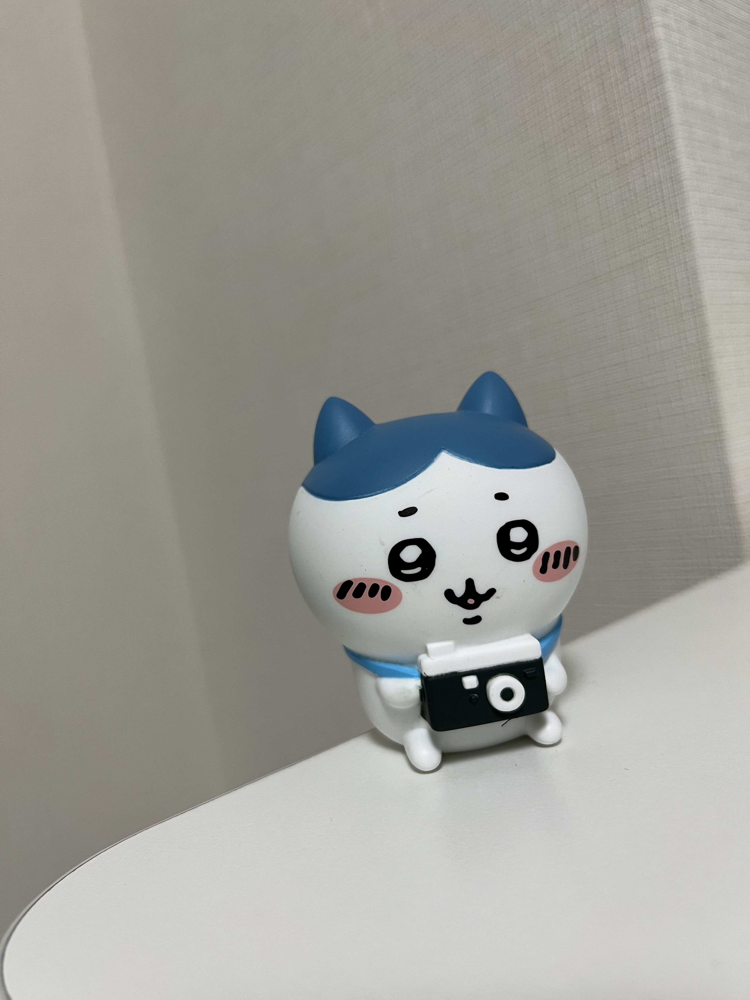

In [5]:
from PIL import Image

# 画像の準備
image = Image.open("IMG_0870.jpg").convert("RGB")
image

In [6]:
# 推論の実行
pixel_values = processor(images=image, return_tensors="pt").pixel_values
generated_ids = model.generate(pixel_values=pixel_values, max_length=50)
generated_caption = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
print(generated_caption)

a small plastic toy with a camera on it.


In [7]:
from transformers import AutoProcessor, AutoModelForCausalLM

# モデルの読み込み
cache_dir = "/home/ec2-user/SageMaker/tmp"
processor = AutoProcessor.from_pretrained("microsoft/git-base-textvqa", cache_dir=cache_dir)
model = AutoModelForCausalLM.from_pretrained("microsoft/git-base-textvqa", cache_dir=cache_dir)

In [28]:
question = "what is in the picture?"

In [29]:
import torch

# 推論の実行
pixel_values = processor(images=image, return_tensors="pt").pixel_values
input_ids = processor(text=question, add_special_tokens=False).input_ids
input_ids = [processor.tokenizer.cls_token_id] + input_ids
input_ids = torch.tensor(input_ids).unsqueeze(0)
generated_ids = model.generate(pixel_values=pixel_values, input_ids=input_ids, max_length=50)
print(processor.batch_decode(generated_ids, skip_special_tokens=True))

['what is in the picture? 8']
